In [1]:
import torch
import os, requests
from torch import nn
from src.model.rcnn import RCNN
from src.model import transforms
from src.config import config
import numpy as np
import cv2
import json
import matplotlib.pyplot as plt
import random
import torchvision

import torchvision.transforms.functional as TF

### Understanding the data structure

In [2]:
# list all files in the current directory
image_dir_path  = '/home/besttic-rd/Téléchargements/parking_rois_gopro/images'
image_name_list = os.listdir('/home/besttic-rd/Téléchargements/parking_rois_gopro/images')
len(image_name_list)

293

Structure of the annotation file

In [3]:
# load anotation file
gopro_annotations_file_path = '/home/besttic-rd/Téléchargements/parking_rois_gopro/annotations.json'

with open(gopro_annotations_file_path) as f:
    gopro_annotations = json.load(f)

def show_structure(d, indent=0):
    for key, value in d.items():
        test = '  ' * indent + str(key)+':', len(value) if isinstance(value, (list, dict)) else type(value)
        print(test[0], test[1])
        if isinstance(value, dict):
            show_structure(value, indent + 1)
        elif isinstance(value, list) and len(value) > 0 and isinstance(value[0], dict):
            show_structure(value[0], indent + 1)

# display the annotation file's structure
show_structure( gopro_annotations )

train: 3
  file_names: 231
  rois_list: 231
  occupancy_list: 231
valid: 3
  file_names: 35
  rois_list: 35
  occupancy_list: 35
test: 3
  file_names: 27
  rois_list: 27
  occupancy_list: 27


show ramdom image from training set with `Opencv` and `Pyplot`

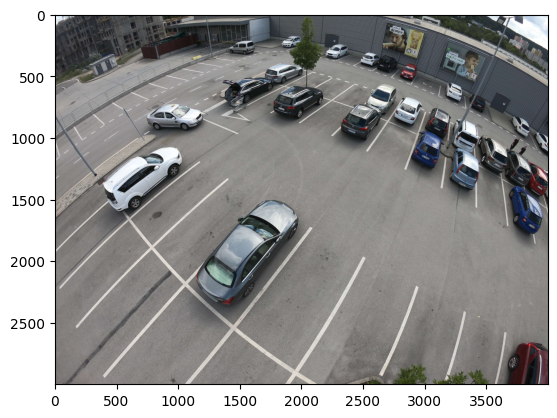

In [4]:
# show ramdom image from test set
def random_image_cv2(annotations, dataset="test"):
    
    random_image_name = annotations[dataset]['file_names'][random.randint(0, len(annotations[dataset]['file_names'])-1)]
    random_image_path = os.path.join(image_dir_path, random_image_name)
    random_image = cv2.imread(random_image_path)
    return random_image_name, random_image_path, cv2.cvtColor(random_image, cv2.COLOR_BGR2RGB)

random_image_name, random_image_path, random_image = random_image_cv2(gopro_annotations)

plt.imshow(random_image)
plt.show()

Display the number of parking places annotated in the choosen random image

In [5]:
# show the anotation list of the corresponding image
def single_image_anotation_list(random_image_name, annotations, dataset="test"):
    idx = annotations[ dataset ]['file_names'].index(random_image_name)
    rois_list  = annotations[ dataset ]['rois_list'][idx]
    label_list = annotations[ dataset ]["occupancy_list"][idx]
    return rois_list, label_list

random_image_rois_list, random_image_label_list = single_image_anotation_list(
    random_image_name, gopro_annotations, dataset="test"
)

print( len(random_image_rois_list), len(random_image_label_list)  )

60 60


#### Load the ramdon image and the parking place list with torch 

In [6]:
# different of shape beteween image read by torch, cv2
random_image_rois_torch = torch.tensor( random_image_rois_list )
random_image_torch      = torchvision.io.read_image( random_image_path )
print(random_image.shape, random_image_torch.shape, random_image_rois_torch.shape)

(3000, 4000, 3) torch.Size([3, 3000, 4000]) torch.Size([60, 4, 2])


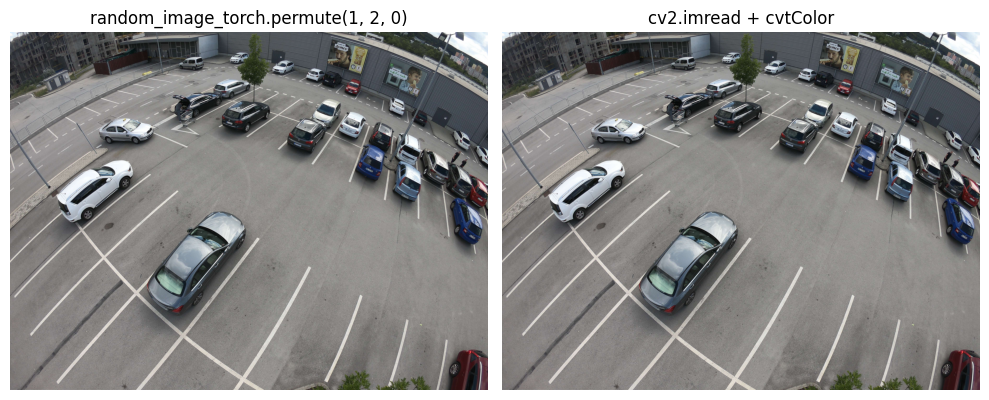

In [7]:
def show_side_by_side(image1, image2):
    # Create a figure with 2 subplots side by side
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Show first image
    axes[0].imshow(image1.permute(1, 2, 0))  # Permute to (H, W, C) for displaying
    axes[0].axis("off")      # Hide axis
    axes[0].set_title("random_image_torch.permute(1, 2, 0)")

    # Show second image
    axes[1].imshow(image2)
    axes[1].axis("off")
    axes[1].set_title("cv2.imread + cvtColor")

    plt.tight_layout()
    plt.show()

show_side_by_side(random_image_torch, random_image)

#### Compare raw roi with with actual location on random image

In [8]:
print( random_image.shape, random_image.max(), random_image.min(), random_image.mean() )
print( random_image_torch.shape, torch.max( random_image_torch ), torch.min( random_image_torch ) )

(3000, 4000, 3) 255 0 122.19044405555556
torch.Size([3, 3000, 4000]) tensor(255, dtype=torch.uint8) tensor(0, dtype=torch.uint8)


In [9]:
# Scale rois coordinates
def scale_rois(image, rois: torch.Tensor):
    _, h, w = image.shape
    rois_torch_cpu = rois.cpu().clone()
    rois_torch_cpu[..., 0] *= (w - 1)
    rois_torch_cpu[..., 1] *= (h - 1)
    return rois_torch_cpu.numpy()   

if torch.max(random_image_rois_torch) <= 1.0 : #or torch.min(random_image_rois_torch) == 0.0:
    print("Warning: rois values are in the range [0, 1]. They will be scaled accordingly.")
    ri_rois_scaled = scale_rois(image=random_image_torch, rois=random_image_rois_torch)

print( f"torch.max(random_image_rois_torch)={torch.max(random_image_rois_torch)}, torch.min(random_image_rois_torch)={torch.min(random_image_rois_torch)}" )
print( f"ri_rois_scaled max={np.max(ri_rois_scaled)}, ri_rois_scaled min={np.min(ri_rois_scaled)}" )

torch.max(random_image_rois_torch)=1.0, torch.min(random_image_rois_torch)=0.0
ri_rois_scaled max=3999.0, ri_rois_scaled min=0.0


#### A view of scaled and unscaled rois

In [10]:
# a view of scaled and unscaled rois
print(ri_rois_scaled.shape, "====", random_image_rois_torch.shape )
print("=======================================================================") 
print(ri_rois_scaled[0, :, :], "\n", "========================\n", random_image_rois_torch[0, :, :])

(60, 4, 2) ==== torch.Size([60, 4, 2])
[[ 469.94748 1480.1085 ]
 [ 377.97046 1333.4904 ]
 [ 845.85345 1000.2685 ]
 [ 991.15015 1086.9066 ]] 
 tensor([[0.1175, 0.4935],
        [0.0945, 0.4446],
        [0.2115, 0.3335],
        [0.2478, 0.3624]])


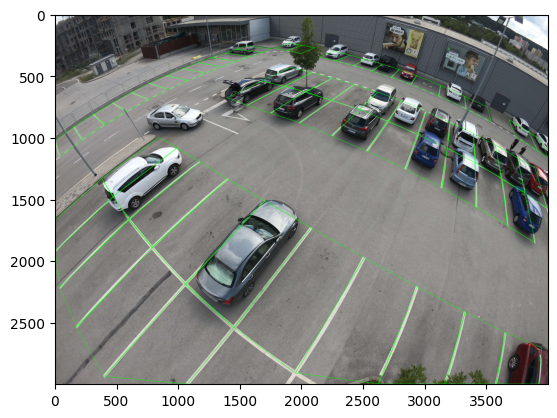

In [11]:
# draw the scaled rois on the image
def draw_rois_on_image(image, rois: torch):
    for roi in rois:
        roi_array = np.array( roi ) 
        cv2.polylines( image, [np.array(roi_array, np.int32)], isClosed=True, color=(0,255,0), thickness=2  )

image = random_image.copy()
draw_rois_on_image(image, ri_rois_scaled)

plt.imshow(image)
plt.show()  

### Understant the ROIS scaling method

In [12]:
rois_test = torch.tensor( ri_rois_scaled ).float()
w = torch.amax(rois_test[:, :, 0], 1) - torch.amin(rois_test[:, :, 0], 1)
h = torch.amax(rois_test[:, :, 1], 1) - torch.amin(rois_test[:, :, 1], 1)
c = torch.mean(rois_test, 1, keepdim=True)
#print(w, h, "=====", c.shape, "\n ======================================\n", c)
print(w.shape, h.shape, c.shape) 
c[0, ...]

torch.Size([60]) torch.Size([60]) torch.Size([60, 1, 2])


tensor([[ 671.2304, 1225.1935]])

In [13]:
w_norm = torch.amax(random_image_rois_torch[:, :, 0], 1) - torch.amin(random_image_rois_torch[:, :, 0], 1)
h_norm = torch.amax(random_image_rois_torch[:, :, 1], 1) - torch.amin(random_image_rois_torch[:, :, 1], 1)
c_norm = torch.mean(random_image_rois_torch, 1, keepdim=True)
# print(w, h, "=====", c.shape, "\n ======================================\n", c)
print(w_norm.shape, h_norm.shape, c_norm.shape) 
c_norm[0, ...]

torch.Size([60]) torch.Size([60]) torch.Size([60, 1, 2])


tensor([[0.1678, 0.4085]])

In [14]:
c = c.repeat(1, 4, 1)
print(c.shape)

torch.Size([60, 4, 2])


In [15]:
c[:, 0, 0] += w/2
c[:, 0, 1] += h/2
c[:, 1, 0] -= w/2
c[:, 1, 1] += h/2
c[:, 2, 0] -= w/2
c[:, 2, 1] -= h/2
c[:, 3, 0] += w/2
c[:, 3, 1] -= h/2
c

tensor([[[ 977.8203, 1465.1135],
         [ 364.6406, 1465.1135],
         [ 364.6406,  985.2734],
         [ 977.8203,  985.2734]],

        [[ 450.6188, 1898.6356],
         [ -23.3277, 1898.6356],
         [ -23.3277, 1306.8331],
         [ 450.6188, 1306.8331]],

        [[ 581.5856, 2187.2056],
         [ -20.9298, 2187.2056],
         [ -20.9298, 1454.1172],
         [ 581.5856, 1454.1172]],

        [[1162.4409, 1646.7197],
         [ 457.2834, 1646.7197],
         [ 457.2834, 1066.9131],
         [1162.4409, 1066.9131]],

        [[1391.3831, 1873.6440],
         [ 588.9178, 1873.6440],
         [ 588.9178, 1175.2100],
         [1391.3831, 1175.2100]],

        [[1694.9741, 2160.5483],
         [ 779.2031, 2160.5483],
         [ 779.2031, 1308.8323],
         [1694.9741, 1308.8323]],

        [[ 778.2034, 2514.7632],
         [  26.3914, 2514.7632],
         [  26.3914, 1640.3887],
         [ 778.2034, 1640.3887]],

        [[1049.1359, 2913.9634],
         [ 162.6905, 2913.963

In [16]:
from src.domain import pooling

# compute a grid of indices for each roi
rois_interpolated = pooling.roi_grid(c, 100)
print(rois_interpolated.shape, torch.max(rois_interpolated), torch.min(rois_interpolated))
# torch.Size([44, 100, 100, 2]) tensor(4009.0361) tensor(9.3950)

torch.Size([60, 100, 100, 2]) tensor(4005.0107) tensor(-23.3277)


In [17]:
rois_interpolated = (rois_interpolated * 2) - 1
print(rois_interpolated.shape, torch.max(rois_interpolated), torch.min(rois_interpolated))

torch.Size([60, 100, 100, 2]) tensor(8009.0215) tensor(-47.6554)


In [18]:
print(rois_interpolated[0].shape)
rois_interpolated[0][None].shape

torch.Size([100, 100, 2])


torch.Size([1, 100, 100, 2])

In [19]:
from torch.nn.functional import grid_sample

random_image_torch = torchvision.io.read_image(random_image_path)
random_image_torch = random_image_torch.to(torch.float32) / 255.0
sampler = grid_sample(random_image_torch[None], rois_interpolated[0][None], align_corners=True)

sampler.shape

torch.Size([1, 3, 100, 100])

# Realize predictions with square roi

In [20]:
# instantiate model
model = RCNN(roi_res=100, pooling_type='square')

# load weights
#url = "https://besttic-rd.s3.amazonaws.com/park_occupancy/models/rcnn.pth"
#r = requests.get(url, allow_redirects=True)
#open("rcnn.psrc/config/config.pyth", 'wb').write(r.content)
#model.load_state_dict(torch.load("rcnn.pth", map_location=torch.device('cpu')))
#model.eval()

# load model weights
weights_path = 'weights.pt'
if not os.path.exists(weights_path):
    r = requests.get('https://storage.googleapis.com/pd-models/RCNN_128_square_gopro.pt')  
    with open(weights_path, 'wb') as f:
        f.write(r.content)
model.load_state_dict(torch.load(weights_path, map_location='cpu'))

/home/besttic-rd/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/besttic-rd/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


<All keys matched successfully>

In [21]:
import torchvision.transforms as T

# inference
random_image_torch = torchvision.io.read_image(random_image_path)
#random_image_torch = random_image_torch.to(torch.float32) / 255.0
#random_image_torch = T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])(random_image_torch)
image_transforms = transforms.preprocess(random_image_torch)
class_logits = model(image_transforms, random_image_rois_torch) # random_image_rois_torch_cpu)
class_scores = class_logits.softmax(1)[:, 1]

class_scores.shape

torch.Size([60])

#### Test on custum image

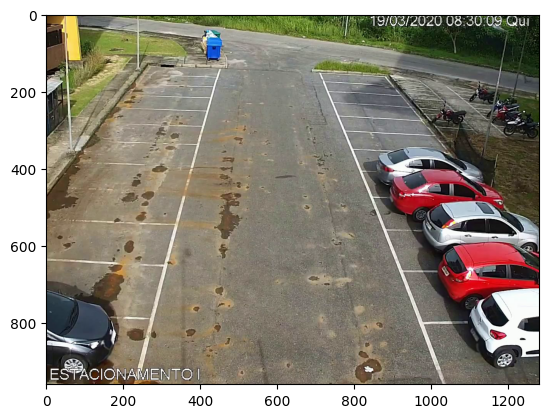

In [22]:
custum_image_path = "/home/besttic-rd/Documents/besttic/parkOccupancy/data/camera_frame.png"
custum_image_torch = torchvision.io.read_image(custum_image_path)

plt.imshow(custum_image_torch.permute(1, 2, 0))
plt.show()

In [23]:
# load a json file

with open("/home/besttic-rd/Documents/besttic/parkOccupancy/data/parking_place_coordinates2.json") as f:
    custum_coordinates = json.load(f)

custum_coordinates

{'0': '[[711, 153], [881, 162], [902, 187], [722, 175]]',
 '1': '[[722, 175], [902, 187], [923, 213], [731, 201]]',
 '2': '[[731, 201], [922, 212], [948, 241], [744, 229]]',
 '3': '[[744, 229], [949, 241], [978, 277], [758, 265]]',
 '4': '[[758, 265], [979, 277], [1011, 316], [775, 304]]',
 '5': '[[775, 304], [1011, 316], [1050, 362], [795, 350]]',
 '6': '[[795, 350], [1051, 364], [1089, 400], [817, 404]]',
 '7': '[[817, 404], [1081, 400], [1133, 451], [846, 473]]',
 '8': '[[846, 473], [1144, 469], [1226, 541], [875, 557]]',
 '9': '[[875, 557], [1239, 564], [1278, 667], [921, 664]]',
 '10': '[[921, 664], [1278, 669], [1278, 794], [973, 800]]',
 '11': '[[973, 800], [1277, 797], [1279, 954], [1033, 955]]',
 '12': '[[267, 134], [454, 142], [445, 164], [255, 156]]',
 '13': '[[255, 156], [445, 164], [436, 188], [239, 182]]',
 '14': '[[239, 182], [437, 189], [428, 217], [215, 211]]',
 '15': '[[215, 211], [429, 218], [419, 253], [193, 244]]',
 '16': '[[193, 244], [419, 253], [408, 291], [164,

In [24]:
def parse_coordinates(coord_str):
    coord_str = coord_str.replace('[', '').replace(']', '')
    points = coord_str.split('), (')
    points = points[0].split(", ")
    coordinates = [[int(points[i]), int(points[i+1])] for i in range(0, len(points), 2)]
    return coordinates

#split_list = custum_coordinates['0'].split('], [')

split_list = [parse_coordinates(val) for _, val in custum_coordinates.items()]
print(len(split_list), split_list[0])

24 [[711, 153], [881, 162], [902, 187], [722, 175]]


In [25]:
w, h = custum_image_torch.shape[2], custum_image_torch.shape[1]
torch_tensor_coordinates = torch.tensor(split_list, dtype=torch.float32)
torch_tensor_coordinates[:, :, 0] /= (w - 1)
torch_tensor_coordinates[:, :, 1] /= (h - 1)

print(torch_tensor_coordinates.shape, custum_image_torch.shape)
print(w, h) 

torch.Size([24, 4, 2]) torch.Size([3, 960, 1280])
1280 960


In [26]:
image = transforms.preprocess(custum_image_torch)
score = model(image, torch_tensor_coordinates)
custum_score = score.softmax(1)[:, 1]
custum_score

tensor([1.9817e-05, 4.1526e-05, 5.2791e-03, 5.6620e-07, 4.5723e-06, 1.6180e-05,
        4.0077e-08, 9.9980e-01, 9.9984e-01, 1.0000e+00, 1.0000e+00, 1.0000e+00,
        1.4893e-04, 7.3057e-01, 6.1277e-06, 8.2613e-09, 8.7434e-09, 8.1639e-10,
        1.9693e-11, 1.0034e-09, 3.3765e-10, 1.3798e-12, 8.9509e-12, 9.9443e-01],
       grad_fn=<SelectBackward0>)

In [27]:
list_score = [custum_score[i].item() for i in range(custum_score.shape[0])]
list_score = [ 1 if s > 0.8 else 0 for s in list_score ]
list_score

[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]

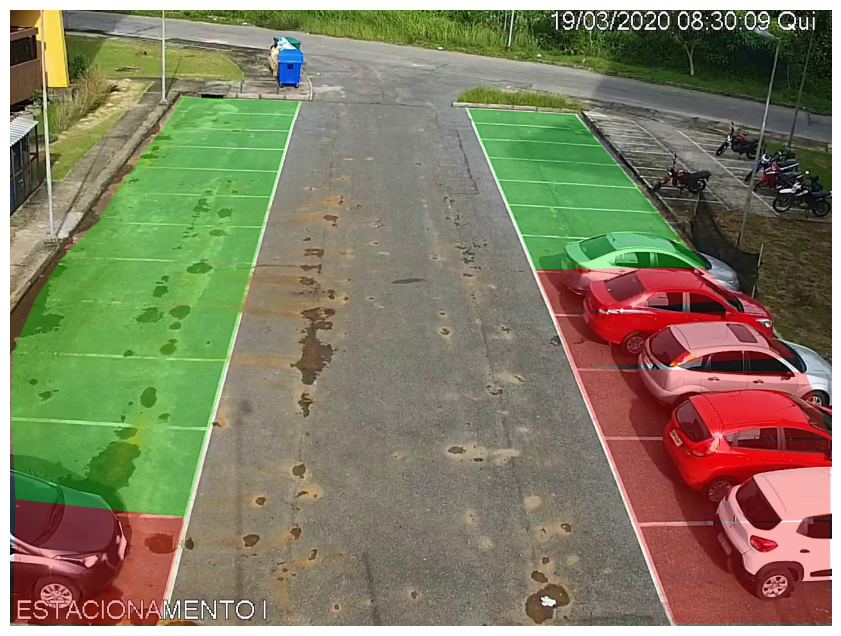

In [28]:
from src.model import visualize as vis

tensor_pred_label = torch.tensor(list_score)
vis.plot_ds_image(image, torch_tensor_coordinates, tensor_pred_label, show=True, fname="custum_image_result.png")

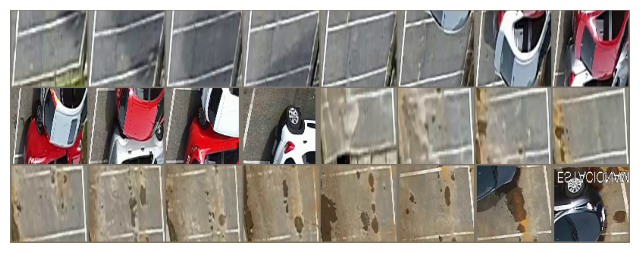

In [29]:
warps = pooling.roi_pool(image, torch_tensor_coordinates, 100, "square") #square  "qdrl"
vis.show_warps(warps)

In [30]:
class Prediction:

    def __init__(self, model, rois_file_path):

        self.model = model

        with open(rois_file_path) as f:
            self.coordinates = json.load(f) 

        self.rois_tensor = self._formated_coordinates()

    def _formated_coordinates(self):
        
        coordinate_list  = [self._parse_coordinates(val) for _, val in self.coordinates.items()]
        return torch.tensor(coordinate_list, dtype=torch.float32)

    def _parse_coordinates(self,  coordinates):

        coord_str = coordinates.replace('[', '').replace(']', '')
        points = coord_str.split('), (')
        points = points[0].split(", ")
        coordinates = [[int(points[i]), int(points[i+1])] for i in range(0, len(points), 2)]

        return coordinates
    
    def normalize_coordinates(self, rois_tensor, w, h):
        rois_tensor[:, :, 0] /= (w - 1)
        rois_tensor[:, :, 1] /= (h - 1)
        return rois_tensor
    
    def preprocess(self, image, res=None):
        """
        Resizes, normalizes, and converts image to float32.
        """
        # resize image to model input size
        if res is not None:
            image = TF.resize(image, res)

        # convert image to float
        image = image.to(torch.float32) / 255

        # normalize image to default torchvision values
        image = T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])(image)

        return image
    
    def predictions(self, image, rois_tensor): 
        #image = transforms.preprocess(image)
        class_logits = self.model(image, rois_tensor) 
        class_scores = class_logits.softmax(1)[:, 1]
        return class_scores
    
    def tensor_pred_label(self, scores, threshold) -> torch.Tensor:
        pred_labels = [ 1 if s > threshold else 0 for s in scores ]
        tensor_pred_label = torch.tensor(pred_labels)
        
        return tensor_pred_label
    
    def show_prediction(self, image_path, torch_tensor_coordinates):
        
        image = torchvision.io.read_image(image_path)
        w, h = image.shape[2], image.shape[1]

        scores_tensor_nromalized = self.normalize_coordinates(self.rois_tensor, w, h)

        image = self.preprocess(image)
        scores = self.predictions(image, scores_tensor_nromalized)
        tensor_pred_label = self.tensor_pred_label(scores, 0.5, image)
       
        vis.plot_ds_image(image, torch_tensor_coordinates, tensor_pred_label, show=True, fname="image_result.png")

In [31]:
class Prediction1:

    def __init__(self, weights_path):
      self.model = RCNN(roi_res=100, pooling_type='square')
      self.model.load_state_dict(torch.load(weights_path, map_location='cpu'))

    def rois_tensor(self, rois_file_path):

        with open(rois_file_path) as f:
            self.coordinates = json.load(f) 
        rois_tensor = self._formated_coordinates()

        return rois_tensor

    def _formated_coordinates(self):
        
        coordinate_list  = [self._parse_coordinates(val) for _, val in self.coordinates.items()]
        return torch.tensor(coordinate_list, dtype=torch.float32)

    def _parse_coordinates(self,  coordinates):

        coord_str = coordinates.replace('[', '').replace(']', '')
        points = coord_str.split('), (')
        points = points[0].split(", ")
        coordinates = [[int(points[i]), int(points[i+1])] for i in range(0, len(points), 2)]

        return coordinates
    
    def normalize_coordinates(self, rois_tensor, w, h):
        rois_tensor[:, :, 0] /= (w - 1)
        rois_tensor[:, :, 1] /= (h - 1)
        return rois_tensor
    
    def preprocess(self, image, res=None):
        """
        Resizes, normalizes, and converts image to float32.
        """
        # resize image to model input size
        if res is not None:
            image = TF.resize(image, res)

        # convert image to float
        image = image.to(torch.float32) / 255

        # normalize image to default torchvision values
        image = T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])(image)

        return image
    
    def predictions(self, image, rois_tensor): 
        class_logits = self.model(image, rois_tensor) 
        class_scores = class_logits.softmax(1)[:, 1]
        return class_scores
    
    def tensor_pred_label(self, scores, threshold, image: torch.Tensor) -> torch.Tensor:
        pred_labels = [ 1 if s > threshold else 0 for s in scores ]
        tensor_pred_label = torch.tensor(pred_labels)
        #vis.plot_ds_image(image, self.rois_tensor, tensor_pred_label, show=True, fname="custum_image_result.png")
        return tensor_pred_label
    
    def show_prediction(self, image_path, parking_place_coordinates_path):
        
        image = torchvision.io.read_image(image_path)
        w, h = image.shape[2], image.shape[1]

        rois_tensor = self.rois_tensor(parking_place_coordinates_path)
        rois_tensor_normalized = self.normalize_coordinates(rois_tensor, w, h)

        image = self.preprocess(image)
        pred_scores = self.predictions(image, rois_tensor_normalized)
        tensor_pred_label = self.tensor_pred_label(pred_scores, 0.5, image)
       
        vis.plot_ds_image(image, rois_tensor_normalized, tensor_pred_label, show=True)

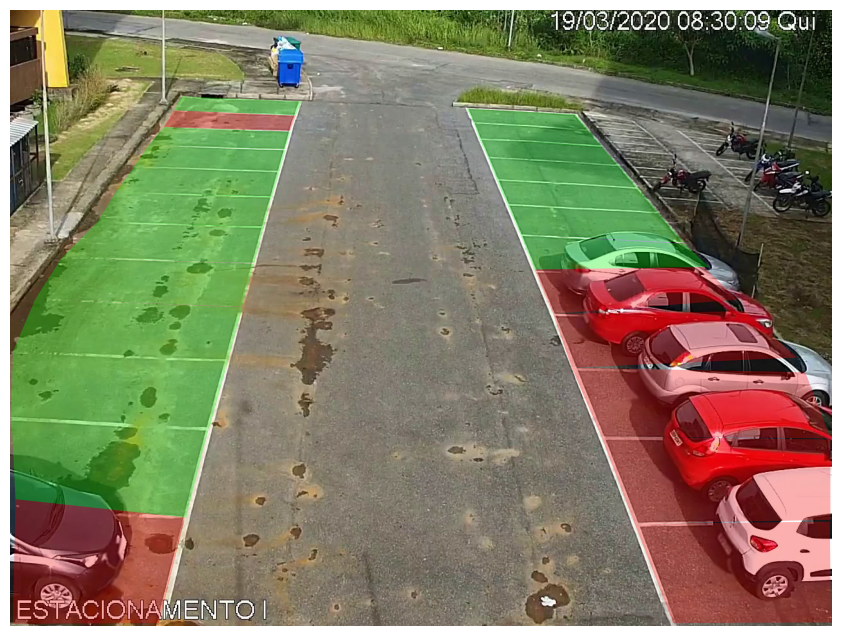

In [32]:
Predictor1 = Prediction1(weights_path=weights_path)

image = torchvision.io.read_image( "/home/besttic-rd/Documents/besttic/parkOccupancy/data/camera_frame.png" )
w, h = image.shape[2], image.shape[1]

rois_tensor = Predictor1.rois_tensor("/home/besttic-rd/Documents/besttic/parkOccupancy/data/parking_place_coordinates2.json")
rois_tensor_normalized = Predictor1.normalize_coordinates(rois_tensor, w, h)

image = Predictor1.preprocess(image)
pred_scores = Predictor1.predictions(image, rois_tensor_normalized)

tensor_pred_label = Predictor1.tensor_pred_label(pred_scores, 0.5, image)

vis.plot_ds_image(image, torch_tensor_coordinates, tensor_pred_label, show=True)

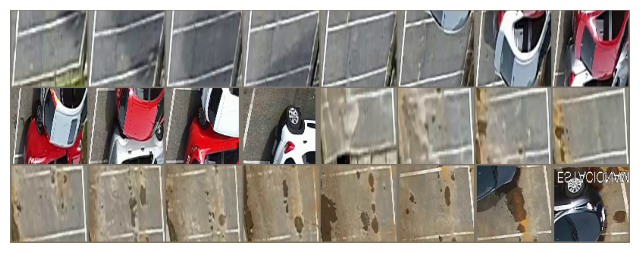

In [33]:
warps = pooling.roi_pool(image, torch_tensor_coordinates, 100, "square") #square  "qdrl"
vis.show_warps(warps)

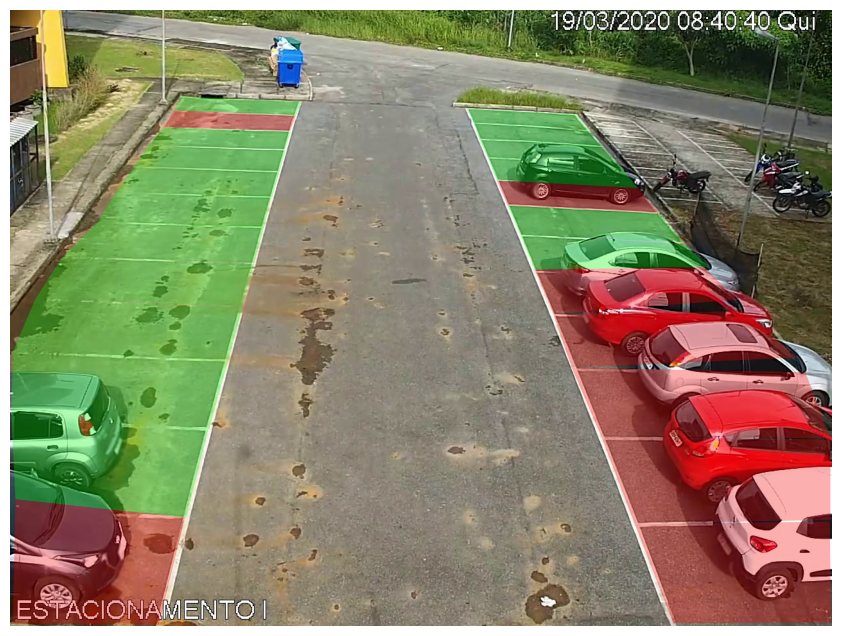

In [34]:
image_pred_path = "/home/besttic-rd/Documents/besttic/parkOccupancy/data/camera_frame_1.png"
parking_place_coordinates_path = "/home/besttic-rd/Documents/besttic/parkOccupancy/data/parking_place_coordinates2.json"

Predictor1.show_prediction(image_pred_path, parking_place_coordinates_path)

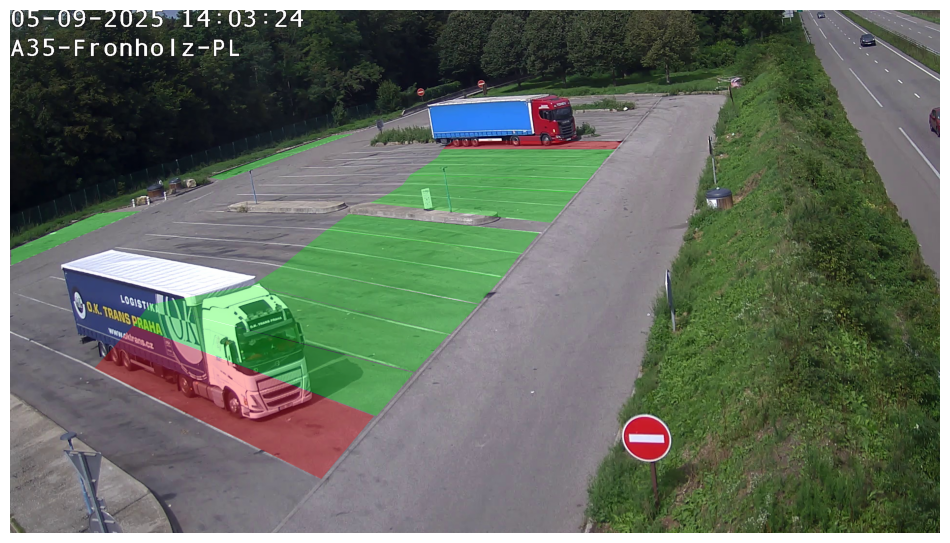

In [35]:
image_focal_0_pred_path = "/home/besttic-rd/Documents/besttic/parkOccupancy/data/scale/frame_focale_0.jpg"
parking_place_coordinates_focal_0_path = "/home/besttic-rd/Documents/besttic/parkOccupancy/data/scale/parking_place_coordinate_focale_0_1.json"

rois_tensor = Predictor1.rois_tensor(parking_place_coordinates_focal_0_path)
rois_tensor_focale_0_normalized = Predictor1.normalize_coordinates(rois_tensor, w, h)

Predictor1.show_prediction(image_focal_0_pred_path, parking_place_coordinates_focal_0_path)

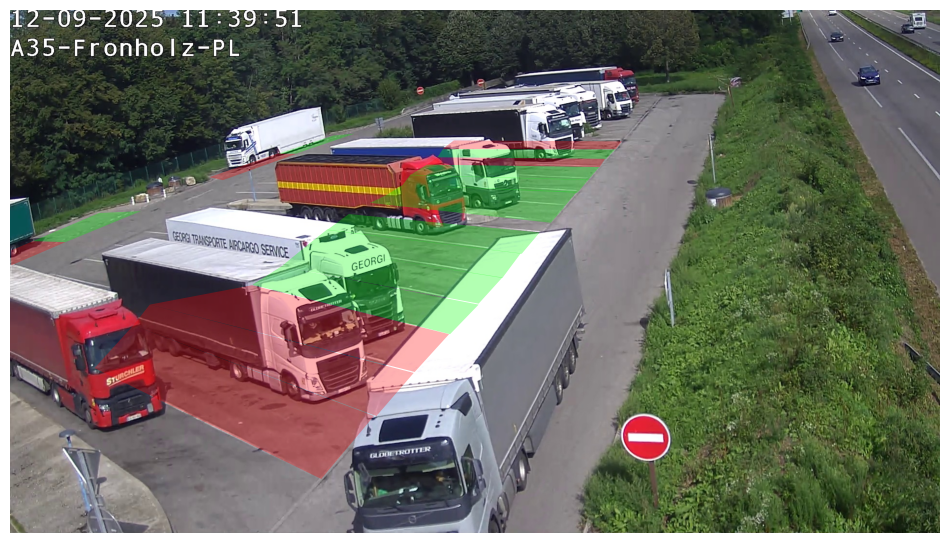

In [36]:
image_focal_0_pred_path = "/home/besttic-rd/Documents/besttic/parkOccupancy/data/scale/frame_focale_0_1.jpg"
parking_place_coordinates_focal_0_path = "/home/besttic-rd/Documents/besttic/parkOccupancy/data/scale/parking_place_coordinate_focale_0_1.json"

Predictor1.show_prediction(image_focal_0_pred_path, parking_place_coordinates_focal_0_path)

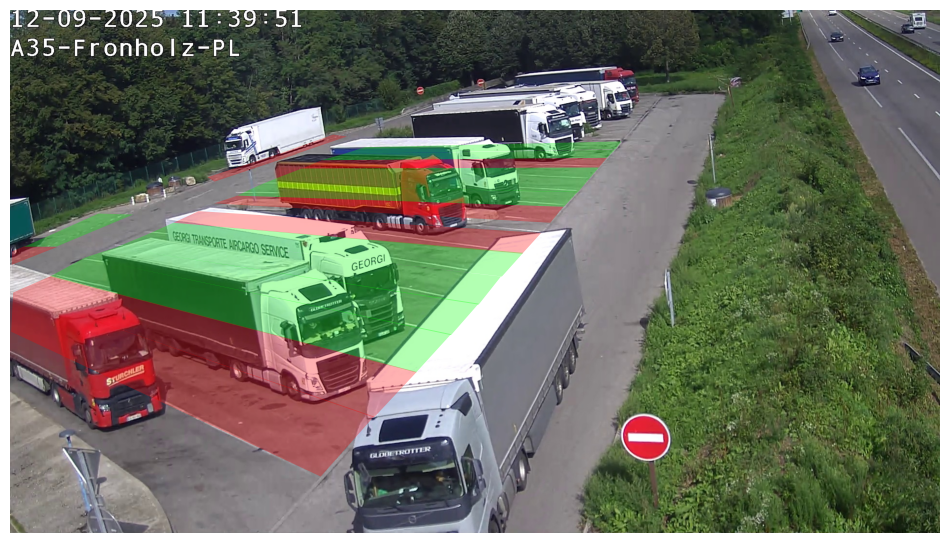

In [38]:
image_focal_0_pred_path = "/home/besttic-rd/Documents/besttic/parkOccupancy/data/scale/frame_focale_0_1.jpg"
parking_place_coordinates_focal_0_path = "/home/besttic-rd/Documents/besttic/parkOccupancy/data/scale/parking_place_coordinate_focale_0.json"

rois_tensor = Predictor1.rois_tensor(parking_place_coordinates_focal_0_path)
rois_tensor_focale_0_normalized = Predictor1.normalize_coordinates(rois_tensor, w, h)

Predictor1.show_prediction(image_focal_0_pred_path, parking_place_coordinates_focal_0_path)

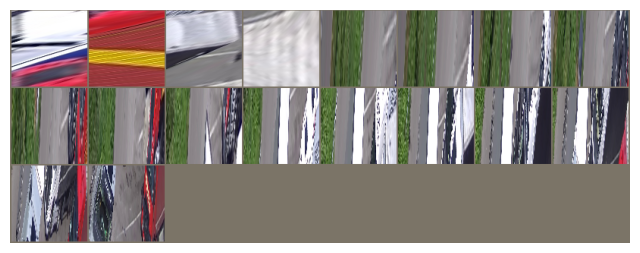

In [39]:
image_focal_0_pred_path = "/home/besttic-rd/Documents/besttic/parkOccupancy/data/scale/frame_focale_0_1.jpg"

tensor_image_focal_0 = torchvision.io.read_image(image_focal_0_pred_path)
tensor_image_focal_0 = Predictor1.preprocess(tensor_image_focal_0)


warps_fo = pooling.roi_pool(tensor_image_focal_0, rois_tensor_focale_0_normalized, 100, "qdrl")
vis.show_warps(warps_fo)

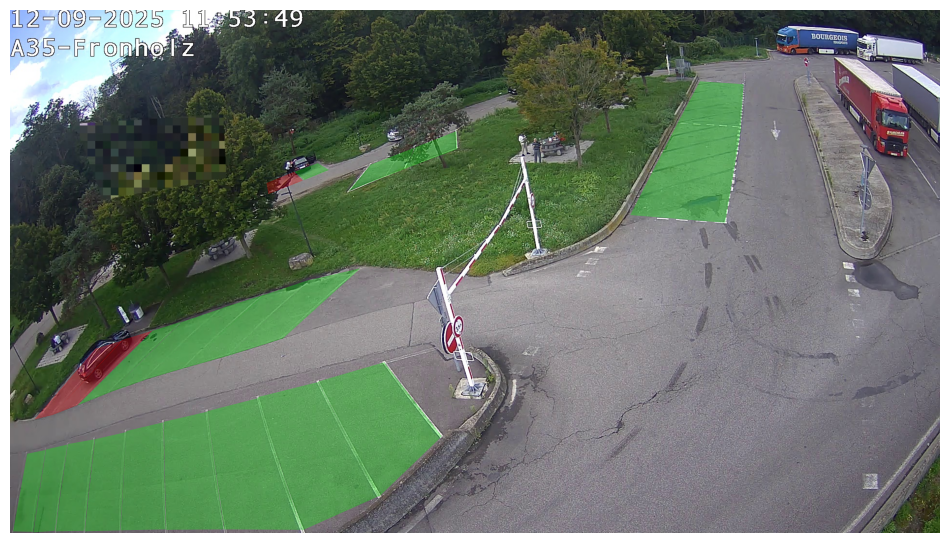

In [40]:
image_focal_1_pred_path = "/home/besttic-rd/Documents/besttic/parkOccupancy/data/camera_frame_focal_1_20250919_095359.jpg"
parking_place_coordinates_focal_1_path = "/home/besttic-rd/Documents/besttic/parkOccupancy/data/scale/parking_place_coordinate_focale_1.json"

rois_tensor_focal_1 = Predictor1.rois_tensor(parking_place_coordinates_focal_1_path)
rois_tensor_focale_1_normalized = Predictor1.normalize_coordinates(rois_tensor_focal_1, w, h)

Predictor1.show_prediction(image_focal_1_pred_path, parking_place_coordinates_focal_1_path)

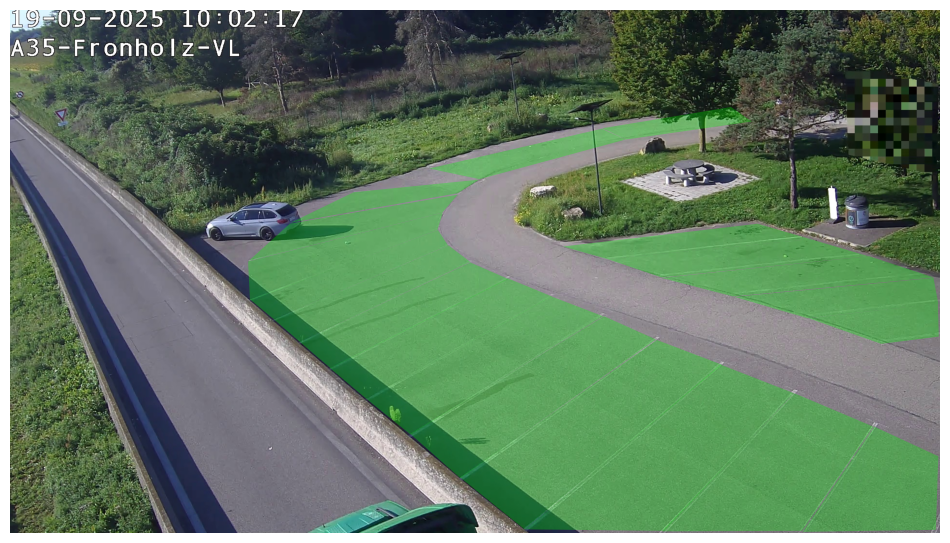

In [41]:
image_focal_2_pred_path = "/home/besttic-rd/Documents/besttic/parkOccupancy/data/camera_frame_focal_2_20250919_100411.jpg"
parking_place_coordinates_focal_2_path = "/home/besttic-rd/Documents/besttic/parkOccupancy/data/scale/parking_place_coordinate_focale_2.json"

rois_tensor_focal_2 = Predictor1.rois_tensor(parking_place_coordinates_focal_2_path)
rois_tensor_focale_2_normalized = Predictor1.normalize_coordinates(rois_tensor_focal_2, w, h)

Predictor1.show_prediction(image_focal_2_pred_path, parking_place_coordinates_focal_2_path)

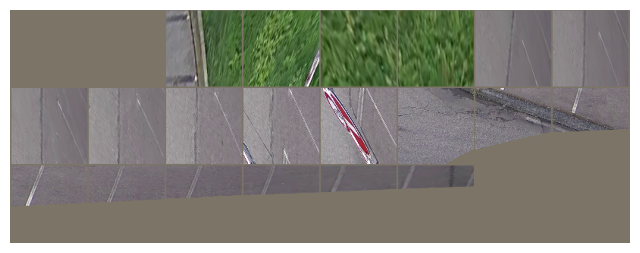

In [42]:
image_focal_1_pred_path = "/home/besttic-rd/Documents/besttic/parkOccupancy/data/camera_frame_focal_1_20250919_095359.jpg"

tensor_image_focal_1 = torchvision.io.read_image(image_focal_1_pred_path)
tensor_image_focal_1 = Predictor1.preprocess(tensor_image_focal_1)

warps_fo = pooling.roi_pool(tensor_image_focal_1, rois_tensor_focale_1_normalized, 100, "qdrl")
vis.show_warps(warps_fo)

tensor([6.9852e-01, 1.0000e+00, 9.7390e-07, 9.9640e-01, 1.8646e-04, 8.3863e-05,
        7.4416e-01, 2.6675e-08, 9.7201e-11, 3.7715e-10, 9.9331e-01, 9.9364e-01,
        1.5890e-01, 3.1745e-02, 6.7351e-07, 2.2794e-01, 9.9996e-01, 1.0000e+00],
       grad_fn=<SelectBackward0>) torch.Size([18])


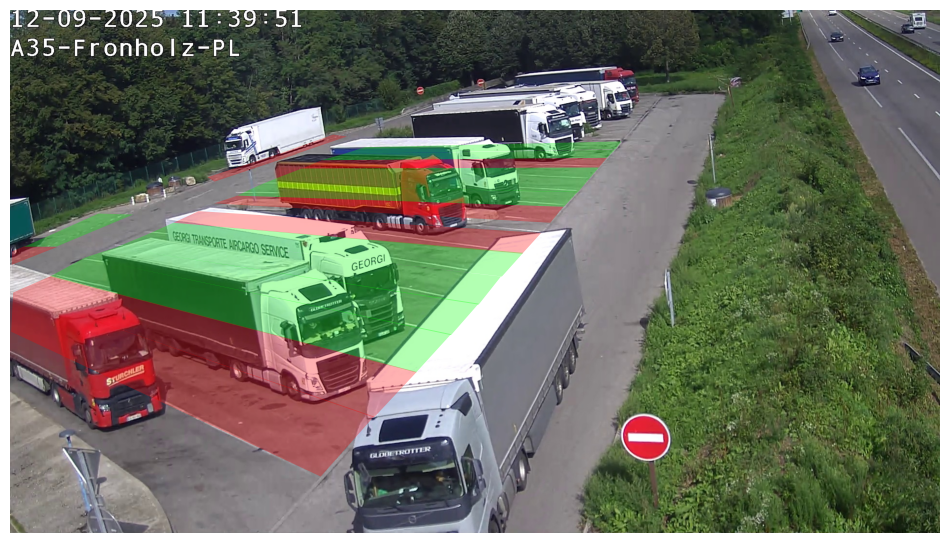

In [43]:
Prediction_01 = Prediction(model, "/home/besttic-rd/Documents/besttic/parkOccupancy/data/scale/parking_place_coordinate_focale_0.json")

focal_0_image_path = "/home/besttic-rd/Documents/besttic/parkOccupancy/data/scale/frame_focale_0_1.jpg"
image_focal_01 = torchvision.io.read_image(focal_0_image_path)
w, h = image_focal_01.shape[2], image_focal_01.shape[1]

image_focal_01 = Prediction_01.preprocess(image_focal_01)
rois_tensor_01 = Prediction_01.rois_tensor 

rois_tensor_normalized_01 = Prediction_01.normalize_coordinates(rois_tensor_01, w, h) 

scores_with_rois_tensor_normalized_01 = Prediction_01.predictions(image_focal_01, rois_tensor_normalized_01)
tensor_pred_label_01 = Prediction_01.tensor_pred_label(scores_with_rois_tensor_normalized_01, 0.5) 

print(scores_with_rois_tensor_normalized_01, scores_with_rois_tensor_normalized_01.shape)

#vis.plot_ds_image(image_focal_01, scores_with_rois_tensor_normalized_01, tensor_pred_label_01, show=True, fname="image_result_0.png")
vis.plot_ds_image(image_focal_01, rois_tensor_normalized_01, tensor_pred_label_01, show=True, fname="image_result_0.png")

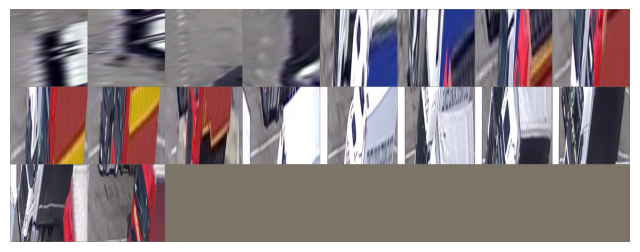

In [44]:
warps_fo1 = pooling.roi_pool(image_focal_01, rois_tensor_normalized_01, 500, "qdrl") #square  "qdrl"
vis.show_warps(warps_fo1)

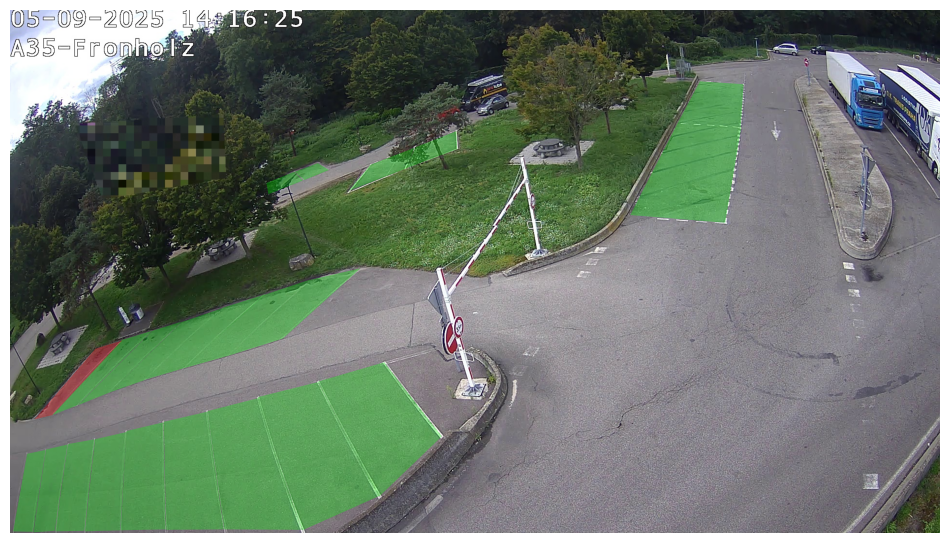

In [45]:
Prediction_1 = Prediction(model, "/home/besttic-rd/Documents/besttic/parkOccupancy/data/scale/parking_place_coordinate_focale_1.json")

focal_1_image_path = "/home/besttic-rd/Documents/besttic/parkOccupancy/data/scale/frame_focale_1.jpg"
image_focal_1 = torchvision.io.read_image(focal_1_image_path)
w, h = image_focal_1.shape[2], image_focal_1.shape[1]

image_focal_1 = Prediction_1.preprocess(image_focal_1)

scores_from_class_focal_1 = Prediction_1.rois_tensor 
scores_from_class_focal_1 = Prediction_1.normalize_coordinates(scores_from_class_focal_1, w, h) 

scores_1 = Prediction_1.predictions(image_focal_1, scores_from_class_focal_1)
tensor_pred_label_1 = Prediction_1.tensor_pred_label(scores_1, 0.5)

vis.plot_ds_image(image_focal_1, scores_from_class_focal_1, tensor_pred_label_1, show=True, fname="image_result.png")

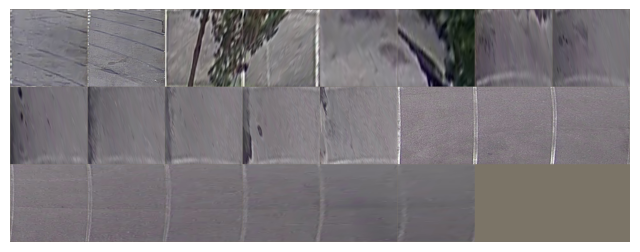

In [46]:
warps_f1 = pooling.roi_pool(image_focal_1, scores_from_class_focal_1, 500, "qdrl") #square  "qdrl"
vis.show_warps(warps_f1)

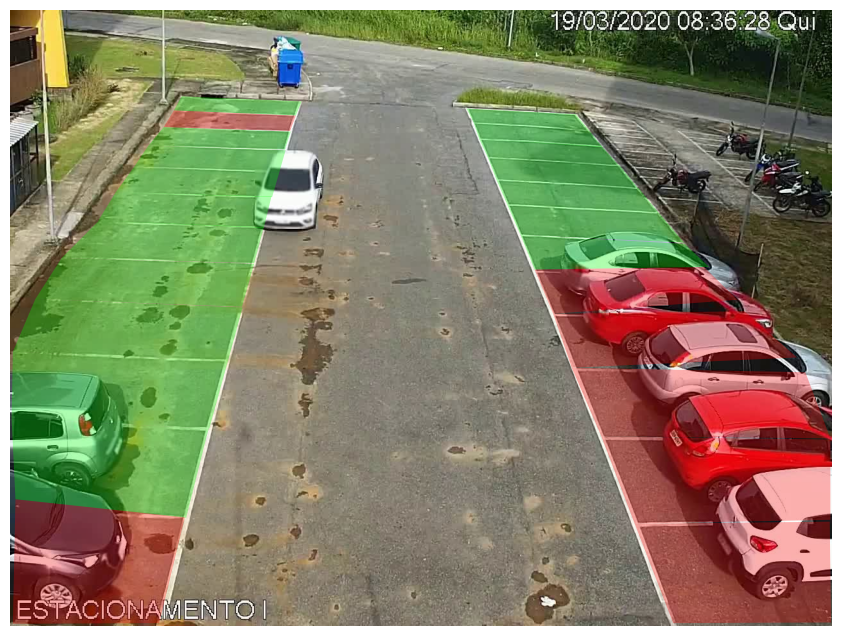

In [47]:
Prediction_1 = Prediction(model, "/home/besttic-rd/Documents/besttic/parkOccupancy/data/parking_place_coordinates2.json")

focal_1_image_path = "/home/besttic-rd/Documents/besttic/parkOccupancy/data/scale/frame_focale_1_1.jpg"
image_focal_1 = torchvision.io.read_image(focal_1_image_path)
w, h = image_focal_1.shape[2], image_focal_1.shape[1]

image_focal_1 = Prediction_1.preprocess(image_focal_1)

rois_tensor_focal_1 = Prediction_1.rois_tensor 
rois_tensor_normalize_focal_1 = Prediction_1.normalize_coordinates(rois_tensor_focal_1, w, h) 

scores_from_class_focal_1 = Prediction_1.predictions(image_focal_1, rois_tensor_normalize_focal_1)
tensor_pred_label_1 = Prediction_1.tensor_pred_label(scores_from_class_focal_1, 0.5)

vis.plot_ds_image(image_focal_1, rois_tensor_normalize_focal_1, tensor_pred_label_1, show=True, fname="image_result.png")

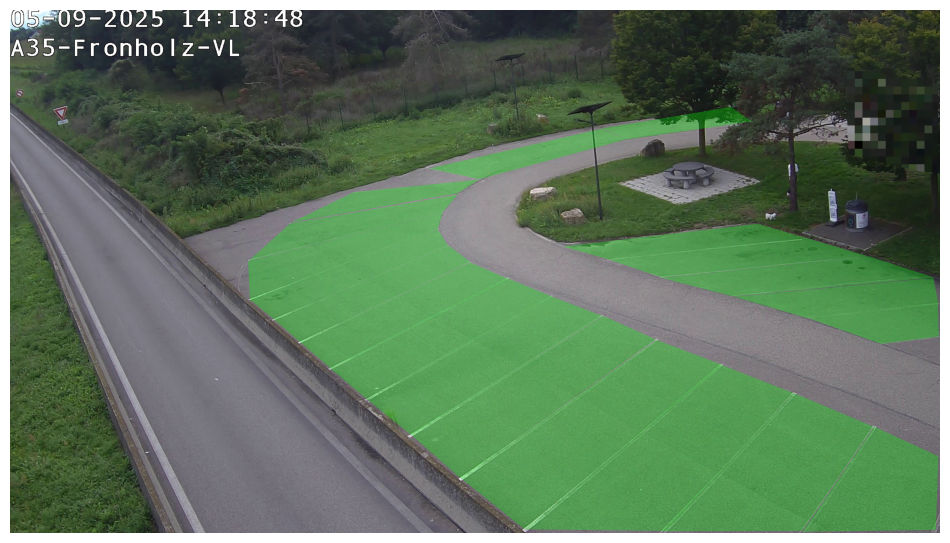

In [48]:
Prediction_2 = Prediction(model, "/home/besttic-rd/Documents/besttic/parkOccupancy/data/scale/parking_place_coordinate_focale_2.json")

focal_2_image_path = "/home/besttic-rd/Documents/besttic/parkOccupancy/data/scale/frame_focale_2.jpg"
image_focal_2 = torchvision.io.read_image(focal_2_image_path)
w, h = image_focal_2.shape[2], image_focal_2.shape[1]

image_focal_2 = Prediction_2.preprocess(image_focal_2)

scores_from_class_focal_2 = Prediction_2.rois_tensor 
scores_from_class_focal_2 = Prediction_2.normalize_coordinates(scores_from_class_focal_2, w, h) 

scores_2 = Prediction_2.predictions(image_focal_2, scores_from_class_focal_2)
tensor_pred_label_2 = Prediction_2.tensor_pred_label(scores_2, 0.7)

vis.plot_ds_image(image_focal_2, scores_from_class_focal_2, tensor_pred_label_2, show=True, fname="image_result.png")